<h1 style="background-color: #4682B4; font-family: newtimeroman; font-size: 250%; color: white; border-radius: 80px 20px; padding: 25px; text-align: center;">
  <b>UrbanSound8K Dataset: Automatic Sound Recognition (ASR) Project with CNN and ANN Models</b>
</h1>

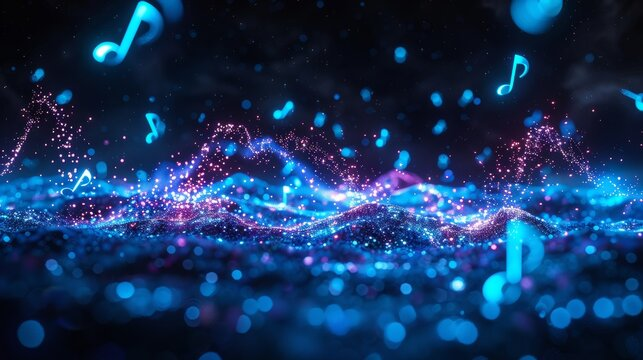

## Project Overview

In this project, I aim to classify urban sounds using the UrbanSound8K dataset, which contains 8732 labeled audio excerpts from ten distinct classes, including sounds like air conditioners, car horns, children playing, dog barks, and more. These sound classes provide a challenging and dynamic dataset for **Automatic Sound Recognition (ASR)**, which focuses on identifying and categorizing sound events from audio recordings. ASR is a critical field for applications in smart city development, environmental monitoring, and public safety, where detecting specific sound patterns is valuable.

This dataset is pre-organized into ten folds, allowing reproducibility and model comparison against results previously reported. The data also includes a metadata file, `UrbanSound8K.csv`, detailing each audio file's unique attributes like file name, start and end times, salience, fold allocation, and class information.

## Dataset Details

- **Audio Files**: 8732 WAV files representing various urban sounds, pre-sorted into 10 folds (fold1 - fold10) for streamlined testing and validation.
- **Classes**: Ten urban sound classes (air_conditioner, car_horn, children_playing, dog_bark, drilling, engine_idling, gun_shot, jackhammer, siren, and street_music) with associated numeric IDs for each class.
- **Meta-Data File**: `UrbanSound8K.csv` provides:
  - `slice_file_name`: Audio file name, formatted as `[fsID]-[classID]-[occurrenceID]-[sliceID].wav`.
  - `fsID`: Freesound ID of the recording.
  - `start` & `end`: Slice start and end times within the original recording.
  - `salience`: Rating of sound prominence (1 = foreground, 2 = background).
  - `fold`: Fold allocation (1-10).
  - `classID` & `class`: Numeric ID and name of the sound class.

## Project Scope

This project will encompass extensive EDA (Exploratory Data Analysis) to prepare and refine audio data for model input. My focus is on developing and comparing CNN (Convolutional Neural Network) and ANN (Artificial Neural Network) models for the ASR task. Through these models, I aim to achieve a robust classification of urban sound classes, contributing insights into model performance and preprocessing effectiveness.

---

        

Each audio signal has unique characteristics. In sound processing, the Mel-Frequency Cepstrum (MFC) represents the short-term power spectrum of a sound, capturing its timbral qualities. Mel-Frequency Cepstral Coefficients (MFCCs) are the individual coefficients that together form the MFC.

Using the librosa library, we’ll extract these characteristics from each audio signal in our dataset and store them in a list.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
print(tf.__version__)

2.17.0


In [3]:
!pip install librosa

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os
import librosa
import tensorflow as tf

from tensorflow import keras
from keras.callbacks import EarlyStopping
from tqdm import tqdm
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from IPython.display import Audio
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

## Audio Signal Loading and Visualization: Librosa vs. Scipy

In [5]:
# First I want to show to how librosa handles sound signals.
# Let's read an example audio signal using librosa
audio_file_path='/content/drive/MyDrive/metadata/fold3/102105-3-0-0.wav'

librosa_audio_data, librosa_sample_rate = librosa.load(audio_file_path)

In [6]:
# An important thing you should know about librosa is librosa converts any stereo signal into mono.
# So librosa converted signal data is one dimensional since it converts all signals into mono and get,
# signal characteristics of your sound file over this mono signal form..

print(librosa_audio_data)

[-0.01117705 -0.02542625 -0.02491572 ...  0.06100571  0.07081934
  0.08787692]


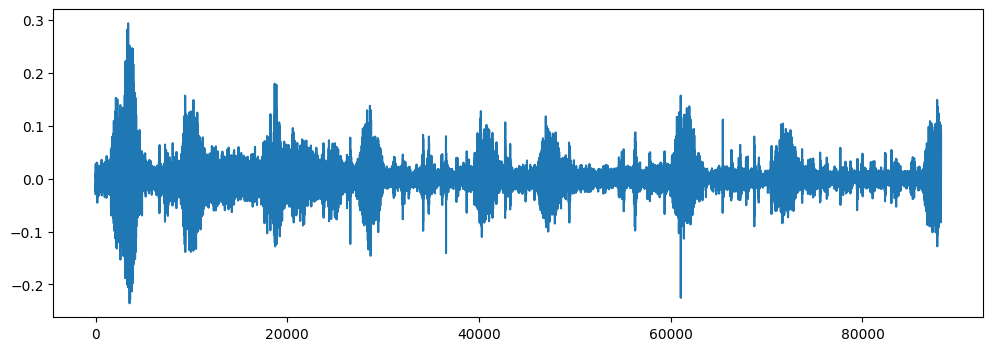

In [7]:
# Lets plot the librosa audio data
# Original audio with 1 channel
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)
plt.show()

In [8]:
# Lets read with scipy
from scipy.io import wavfile as wav
wave_sample_rate, wave_audio = wav.read(audio_file_path)

In [9]:
wave_audio

array([[   76, -1034],
       [ -169, -1034],
       [ -547, -1092],
       ...,
       [ 5538,  -354],
       [ 5498,   -67],
       [ 5269,   312]], dtype=int16)

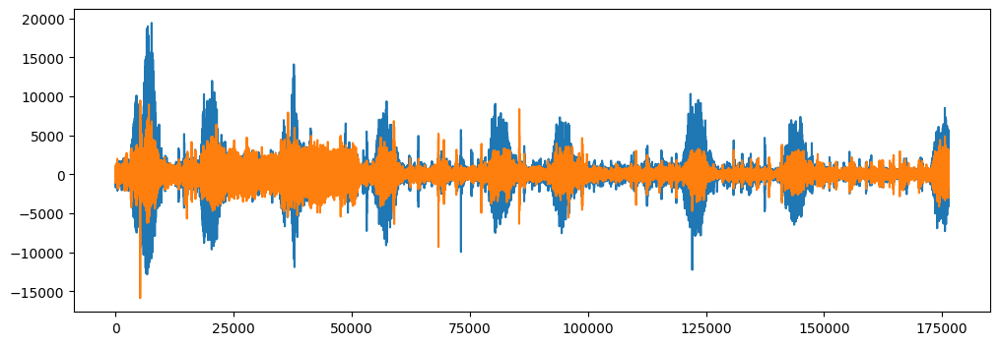

In [10]:
# Original audio with 2 channels
plt.figure(figsize=(12, 4))
plt.plot(wave_audio)
plt.show()

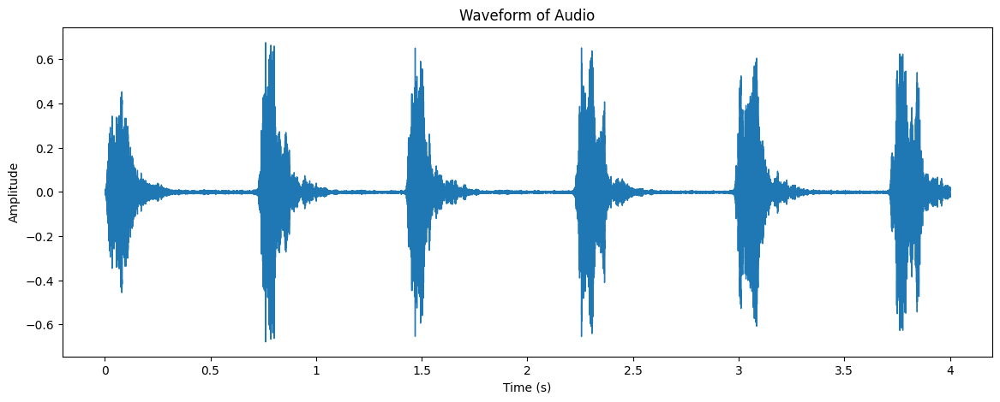

In [11]:
y, sr = librosa.load('/content/drive/MyDrive/metadata/fold10/100795-3-1-1.wav')

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform of Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

In this visualization, we examine the waveform of an audio file. The waveform shows how the audio signal changes over time, displaying the amplitude of the signal as it varies with time.

Waveforms are particularly useful for understanding the general structure and characteristics of the audio. For instance, high amplitude values indicate sections of the audio with high intensity, while low amplitude values represent quieter or low-energy parts. This type of visualization is ideal for analyzing temporal changes in the sound, such as silent moments or intense segments. Such insights provide a foundational understanding of the audio for tasks like sound classification, recognition, and processing.

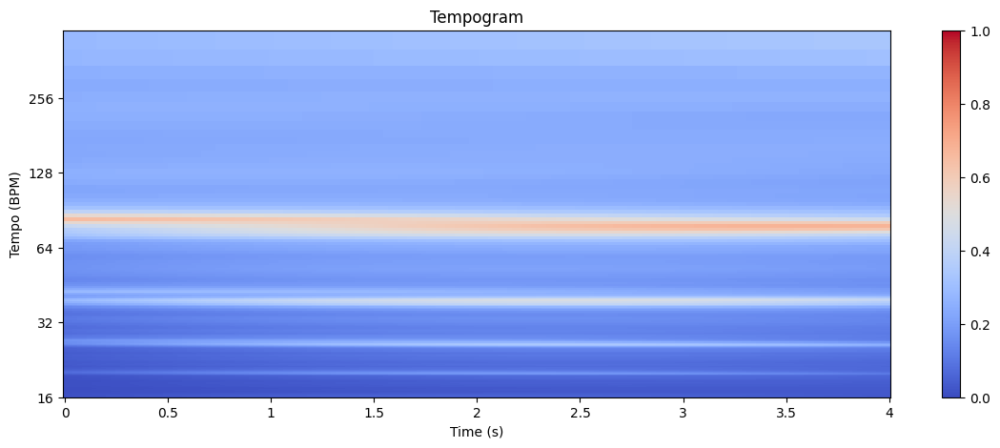

In [12]:
oenv = librosa.onset.onset_strength(y=y, sr=sr)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)

plt.figure(figsize=(14, 5))
librosa.display.specshow(tempogram, sr=sr, x_axis="time", y_axis="tempo")
plt.colorbar()
plt.title("Tempogram")
plt.xlabel("Time (s)")
plt.ylabel("Tempo (BPM)")
plt.show()

This visualization displays the tempogram of an audio signal, which provides insight into how the tempo, or beat, changes over time. The tempogram is generated by analyzing the onset strength, capturing the moments of change or impact in the audio.

By plotting the tempo, we can see variations in the rhythm, allowing us to identify patterns such as steady beats or fluctuating tempos throughout the duration of the audio. This is particularly useful for music and rhythm analysis, where understanding the tempo dynamics is crucial for tasks like genre classification, beat tracking, and music segmentation. The tempogram helps highlight rhythmic changes that can provide deeper insights into the structure and style of the sound.

##  Extracting and Visualizing MFCCs from Audio Dataset

In this section, we will utilize Mel-Frequency Cepstral Coefficients (MFCCs) derived from the audio samples. The MFCCs capture the frequency distribution over a specified window size, enabling the analysis of both frequency and temporal characteristics of the sound. These audio representations will help us extract features essential for classification tasks.


In [13]:
mfccs = librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40)   #n_mfcc: number of MFCCs to return
print(mfccs.shape)

(40, 173)


In [14]:
mfccs

array([[-2.74524567e+02, -2.46964874e+02, -2.40361237e+02, ...,
        -2.19329987e+02, -2.18414948e+02, -2.17820816e+02],
       [ 8.14012299e+01,  7.74209518e+01,  8.13406219e+01, ...,
         1.16859703e+02,  1.13976654e+02,  9.65637970e+01],
       [-3.39259148e+01, -3.64744110e+01, -5.11566048e+01, ...,
        -5.13731766e+01, -6.29509621e+01, -5.71873894e+01],
       ...,
       [-5.18415880e+00, -1.41824341e+00,  3.67195153e+00, ...,
         6.38548553e-01, -5.71901679e-01,  4.83797836e+00],
       [-1.20135765e+01, -1.12624226e+01, -4.61993885e+00, ...,
        -3.03686571e+00,  3.28403711e-02, -2.44187355e-01],
       [ 2.18140626e+00, -3.86890817e+00, -6.66064501e+00, ...,
        -1.50853348e+00, -5.12778378e+00, -9.02797318e+00]], dtype=float32)

In [15]:
# We will extract MFCC's for every audio file in the dataset..

audio_dataset_path = "/content/drive/MyDrive/metadata"
metadata = pd.read_csv('/content/drive/MyDrive/metadata/UrbanSound8K.csv')
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [16]:
Audio('/content/drive/MyDrive/metadata/fold1/102842-3-0-1.wav')


In [17]:
Audio('/content/drive/MyDrive/metadata/fold2/102871-8-0-10.wav')

In [18]:
Audio('/content/drive/MyDrive/metadata/fold3/103199-4-0-6.wav')

In [19]:
Audio('/content/drive/MyDrive/metadata/fold4/116484-3-0-12.wav')

In [20]:
Audio('/content/drive/MyDrive/metadata/fold5/100852-0-0-1.wav')

In [21]:
Audio('/content/drive/MyDrive/metadata/fold6/104327-2-0-26.wav')

In [22]:
Audio('/content/drive/MyDrive/metadata/fold7/102853-8-0-4.wav')

In [23]:
Audio('/content/drive/MyDrive/metadata/fold8/107090-1-0-0.wav')

In [24]:
Audio('/content/drive/MyDrive/metadata/fold9/101729-0-0-14.wav')

In [25]:
Audio('/content/drive/MyDrive/metadata/fold10/100795-3-1-2.wav')

<ipython-input-26-6870b821da33>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")


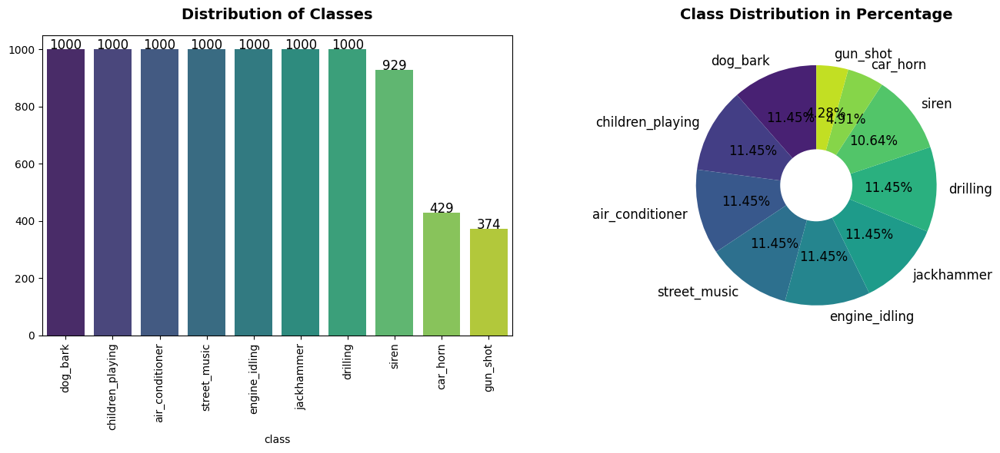

In [26]:
# Lets see the distribution of classes
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
class_counts = metadata["class"].value_counts()

sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
plt.title("Distribution of Classes", fontweight="bold", size=14, pad=15)

for index, value in enumerate(class_counts.values):
    plt.text(index, value, str(value), ha="center", fontsize=12)

plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
colors = sns.color_palette("viridis", len(class_counts))
plt.pie(class_counts, labels=class_counts.index, autopct="%.2f%%",
        colors=colors, startangle=90, textprops={"fontsize": 12})

center_circle = plt.Circle((0, 0), 0.3, fc="white")
plt.gca().add_artist(center_circle)
plt.title("Class Distribution in Percentage", fontweight="bold", size=14, pad=15)

plt.tight_layout()
plt.show()

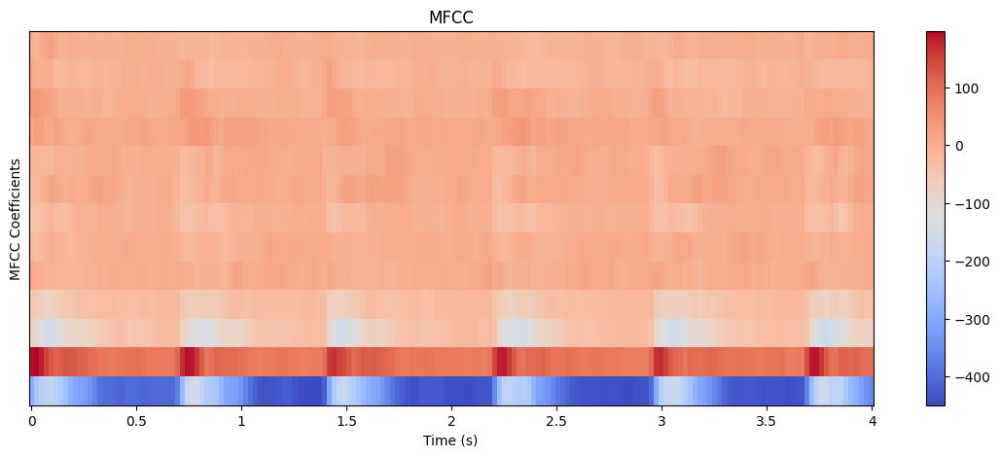

In [27]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

plt.figure(figsize=(14, 5))
librosa.display.specshow(mfccs, sr=sr, x_axis="time")
plt.colorbar()
plt.title("MFCC")
plt.xlabel("Time (s)")
plt.ylabel("MFCC Coefficients")
plt.show()


This visualization shows the Mel-Frequency Cepstral Coefficients (MFCCs) of the audio signal. MFCCs capture essential timbral characteristics of the audio by representing its short-term power spectrum in a way that approximates human hearing. Each coefficient in the MFCCs corresponds to different aspects of the audio's spectral properties, such as pitch and tone.

By plotting the MFCCs over time, we can observe how these characteristics evolve, which can reveal distinct patterns related to different types of sounds, spoken words, or musical qualities. This makes MFCC visualization valuable for tasks like speech recognition, music genre classification, and sound event detection, as it highlights essential features that define the audio's unique qualities.

## Audio Feature Extraction and Preprocessing for Classification

In [28]:
!pip install resampy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 33.8 MB/s eta 0:00:00


In [29]:
import resampy

In [30]:
!pip install --upgrade librosa numpy scipy soundfile resampy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 81.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cupy-cuda12x 12.2.0 requires numpy<1.27,>=1.20, but you have numpy 2.0.2 which is incompatible.
gensim 4.3.3 requires numpy<2

In [31]:
!pip show resampy

Name: resampy
Version: 0.4.3
Summary: Efficient signal resampling
Home-page: https://github.com/bmcfee/resampy
Author: Brian McFee
Author-email: brian.mcfee@nyu.edu
License: ISC
Location: /usr/local/lib/python3.10/dist-packages
Requires: numba, numpy
Required-by: 


In [32]:
!pip install numpy==1.26.4 scipy==1.13.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 11.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1


In [33]:
def features_extractor(file_name):
    # Load audio with its original sample rate
    audio, sr = librosa.load(file_name, sr=None)

    # Resample the audio data
    try:
        audio = resampy.resample(audio, sr, 22050)  # Set target sample rate to 22050
        sr = 22050  # Update the sample rate to the new value
    except Exception as e:
        print(f"Error in resampling {file_name}: {e}")
        return None  # Exit the function if an error occurs

    # Feature extraction steps (MFCC, chroma, mel, etc.) continue here
    # For example:
    mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=40)

    # Combine and return features (as per your design)
    return mfccs

In [34]:
# Now we iterate through every audio file and extract features using Mel-Frequency Cepstral Coefficients

# Initialize a list to hold the extracted features
extracted_features = []

# Iterate through each audio file in the metadata
for index_num, row in tqdm(metadata.iterrows(), total=metadata.shape[0]):
    # Construct the full file path for the audio file
    file_name = os.path.join(os.path.abspath(audio_dataset_path), 'fold' + str(row["fold"]) + '/', str(row["slice_file_name"]))
    final_class_labels = row["class"]

    try:
        # Extract features from the audio file
        data = features_extractor(file_name)

        # Only add to the list if data is not None
        if data is not None:
            extracted_features.append([data, final_class_labels])
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

# At this point, extracted_features will contain the feature data and labels

 41%|████      | 3555/8732 [37:27<55:14,  1.56it/s]/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
 95%|█████████▌| 8326/8732 [1:26:14<03:34,  1.89it/s]/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1102
  warnings.warn(
 95%|█████████▌| 8329/8732 [1:26:16<03:00,  2.24it/s]/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1522
  warnings.warn(
100%|██████████| 8732/8732 [1:30:13<00:00,  1.61it/s]


In [35]:
# We will convert extracted_features to Pandas dataframe
extracted_features_df = pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df

,feature,class
0,"[[-333.38168, -172.86313, -94.09413, -60.86848...",dog_bark
1,"[[-489.11713, -451.05603, -445.70062, -440.020...",children_playing
2,"[[-494.69894, -468.22916, -476.6907, -482.8309...",children_playing
3,"[[-444.25037, -408.51923, -404.58514, -404.187...",children_playing
4,"[[-470.15686, -434.04797, -438.31635, -437.627...",children_playing
...,...,...
8727,"[[-426.88046, -399.10907, -402.37387, -403.812...",car_horn
8728,"[[-479.73572, -451.0463, -447.31027, -442.0757...",car_horn
8729,"[[-325.3323, -298.1148, -300.3505, -299.12598,...",car_horn
8730,"[[-400.48465, -366.7077, -362.00775, -360.2878...",car_horn


In [36]:
# Check types and shapes of the first few features in the feature column
for idx, feature in enumerate(extracted_features_df['feature'].head()):
    print(f"Index {idx}: Type: {type(feature)}, Shape: {np.shape(feature)}")

Index 0: Type: <class 'numpy.ndarray'>, Shape: (40, 14)
Index 1: Type: <class 'numpy.ndarray'>, Shape: (40, 173)
Index 2: Type: <class 'numpy.ndarray'>, Shape: (40, 173)
Index 3: Type: <class 'numpy.ndarray'>, Shape: (40, 173)
Index 4: Type: <class 'numpy.ndarray'>, Shape: (40, 173)


In [37]:
# Target length for padding or trimming
target_length = 173

# Initialize lists to store features and labels with consistent length
features = []
labels = []

for i, row in extracted_features_df.iterrows():
    f = row['feature']
    if isinstance(f, np.ndarray) and f.shape[0] == 40:
        # Pad or trim each feature to the target length
        padded_feature = np.pad(f, ((0, 0), (0, max(0, target_length - f.shape[1]))), mode='constant')[:, :target_length]
        features.append(padded_feature)
        labels.append(row['class'])

# Convert to numpy arrays
X = np.array(features)
y = np.array(labels)

# Ensure X and y have the same length
print("Length of X:", len(X))
print("Length of y:", len(y))


Length of X: 8732
Length of y: 8732


In [38]:
X.shape

(8732, 40, 173)

In [39]:
X

array([[[-3.33381683e+02, -1.72863129e+02, -9.40941315e+01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.21305176e+02,  8.79235916e+01,  6.71250992e+01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.04763977e+02, -1.24708679e+02, -1.34922775e+02, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 5.09971716e-02, -1.37148130e+00,  3.45868921e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.86306584e+00, -8.16453171e+00, -5.39693785e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.84838998e+00,  2.78952527e+00, -3.39022100e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[-4.89117126e+02, -4.51056030e+02, -4.45700623e+02, ...,
         -4.24866211e+02, -4.22459015e+02, -4.36424805e+02],
        [ 9.48173370e+01,  1.04262009e+02,  1.04237656e+02, ...,
          8.07019806e+01,  7.73587036e

In [40]:
y

array(['dog_bark', 'children_playing', 'children_playing', ...,
       'car_horn', 'car_horn', 'car_horn'], dtype='<U16')

In [41]:
y.shape

(8732,)

In [42]:
# We should perform Label Encoding since we need one hot encoded values for output classes in our model (1s and 0s)

# lets remind one-hot encoding:
# 1 0 0 0 0 0 0 0 0 0 => air_conditioner
# 0 1 0 0 0 0 0 0 0 0 => car_horn
# 0 0 1 0 0 0 0 0 0 0 => children_playing
# 0 0 0 1 0 0 0 0 0 0 => dog_bark
# ...
# 0 0 0 0 0 0 0 0 0 1 => street_music

labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

In [43]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [44]:
y[0]

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0.])

# Splitting the Dataset into Training and Test Sets

In [45]:
# Split dataset into training and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [46]:
X_train

array([[[-1.27151115e+02, -9.82862854e+01, -1.06735771e+02, ...,
         -1.46654510e+02, -1.52433411e+02, -1.70035019e+02],
        [ 1.02152466e+02,  1.01078835e+02,  9.53589325e+01, ...,
          1.19735794e+02,  1.21217384e+02,  1.17960678e+02],
        [-1.08037434e+01, -1.10969143e+01, -1.18420162e+01, ...,
         -2.31760006e+01, -2.00930481e+01, -1.51416454e+01],
        ...,
        [ 8.76582503e-01,  1.94106579e+00,  2.76951265e+00, ...,
          5.45932293e+00,  3.53269863e+00, -2.28514957e+00],
        [ 1.61106098e+00, -4.50162697e+00, -6.24072456e+00, ...,
          1.56167161e+00,  8.34541678e-01,  5.07319832e+00],
        [ 8.97156811e+00,  7.13970947e+00,  5.22619629e+00, ...,
          6.44968557e+00,  1.23410141e+00,  1.61090541e+00]],

       [[-2.60257778e+01, -2.35055828e+00, -8.13803577e+00, ...,
         -1.45590887e+01, -4.46801758e+00, -1.47991714e+01],
        [ 9.57369232e+01,  9.10187988e+01,  8.76194763e+01, ...,
          8.40538025e+01,  8.72075806e

In [47]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [48]:
X_train.shape

(6985, 40, 173)

In [49]:
X_test.shape

(1747, 40, 173)

In [50]:
y_train.shape

(6985, 10)

In [51]:
y_test.shape

(1747, 10)

# Training and Evaluating a CNN Model


In [52]:
num_labels = 10

In [53]:
# Reshape X for CNN
X_train = X_train.reshape(X_train.shape[0], 40, 173, 1)
X_test = X_test.reshape(X_test.shape[0], 40, 173, 1)

In [54]:
X_train.shape
X_test.shape

(1747, 40, 173, 1)

In [55]:
# Define the CNN model
cnn_model = models.Sequential([
    # First Convolutional layer
    layers.Conv2D(32, (3, 3), activation='relu', padding='valid', input_shape=(40, 173, 1)),
    layers.MaxPooling2D((2, 2), padding='same'),

    # Second Convolutional layer
    layers.Conv2D(64, (3, 3), activation='relu', padding='valid'),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.3),

    # Third Convolutional layer
    layers.Conv2D(128, (3, 3), activation='relu', padding='valid'),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.3),

    # Fourth Convolutional layer
    layers.Conv2D(256, (3, 3), activation='relu', padding='valid'),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.3),

    # Global Average Pooling and Fully Connected layers
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),  # Additional dropout for regularization
    layers.Dense(10, activation='softmax')  # Output layer for 10 classes
])

# Compile the model with Adam optimizer and learning rate adjustment
opt = optimizers.Adam(learning_rate=0.001)
cnn_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

# Model summary
cnn_model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 38, 171, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 19, 86, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 17, 84, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 9, 42, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 9, 42, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 7, 40, 128)          │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 4, 20, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 4, 20, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 2, 18, 256)          │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 1, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 456,202 (1.74 MB)

 Trainable params: 456,202 (1.74 MB)

 Non-trainable params: 0 (0.00 B)

In [56]:
# EarlyStopping configuration
callback = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=8, verbose=1, mode='auto',
    baseline=None, restore_best_weights=True  # Set to True to restore best weights
)

# Train the model
batch_size = 8
history = cnn_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=15,
    callbacks=[callback],
    batch_size=batch_size
)

Epoch 1/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 119s 127ms/step - accuracy: 0.2916 - loss: 2.0887 - val_accuracy: 0.6256 - val_loss: 1.1400
Epoch 2/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 131s 115ms/step - accuracy: 0.6030 - loss: 1.1467 - val_accuracy: 0.6629 - val_loss: 1.0224
Epoch 3/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 98s 112ms/step - accuracy: 0.6859 - loss: 0.9272 - val_accuracy: 0.7733 - val_loss: 0.7517
Epoch 4/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 106s 121ms/step - accuracy: 0.7359 - loss: 0.7904 - val_accuracy: 0.7613 - val_loss: 0.7343
Epoch 5/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 99s 113ms/step - accuracy: 0.7795 - loss: 0.6526 - val_accuracy: 0.8082 - val_loss: 0.5928
Epoch 6/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 98s 112ms/step - accuracy: 0.8013 - loss: 0.6026 - val_accuracy: 0.7916 - val_loss: 0.6275
Epoch 7/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 140s 110ms/step - accuracy: 0.8070 - loss: 0.5863 - val_accuracy: 0.8157 - val_loss: 0.5802
Epoch 8/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 141s 110ms/step - accuracy: 0.8340 - lo

In [57]:
validation_test_set_accuracy = cnn_model.evaluate(X_test,y_test,verbose=0)
print(validation_test_set_accuracy[1])

0.8906697034835815


In [58]:
X_test[1]

array([[[-357.2249   ],
        [-233.70222  ],
        [-206.8073   ],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]],

       [[  -2.313951 ],
        [ -30.475128 ],
        [ -31.71245  ],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]],

       [[ -55.482582 ],
        [ -69.58107  ],
        [ -60.11659  ],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]],

       ...,

       [[   7.3751965],
        [  11.319656 ],
        [  15.388883 ],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]],

       [[   3.5543785],
        [   4.738174 ],
        [   5.6932344],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]],

       [[  -2.0807858],
        [  -7.233599 ],
        [ -10.508385 ],
        ...,
        [   0.       ],
        [   0.       ],
        [   0.       ]]], dtype=float32)

## CNN Model Performance Evaluation

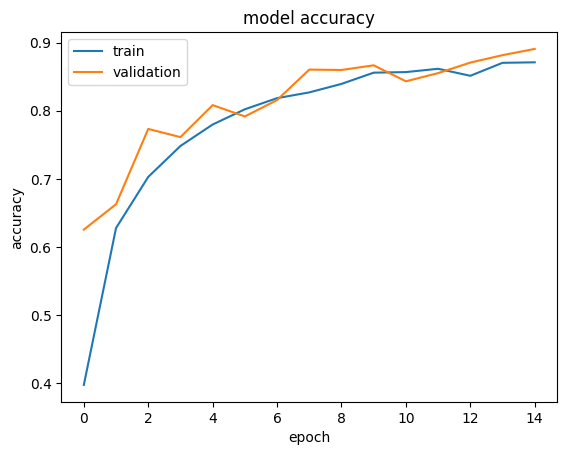

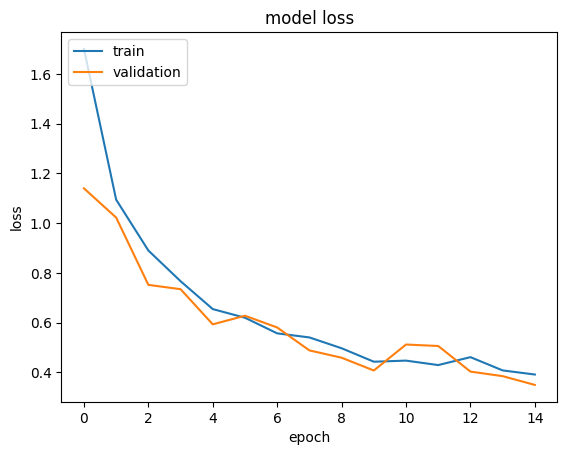

In [59]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [60]:
Y_pred = cnn_model.predict(X_test)
Y_pred = [np.argmax(i) for i in Y_pred]
y_test = [np.argmax(i) for i in y_test]

55/55 ━━━━━━━━━━━━━━━━━━━━ 12s 221ms/step


In [61]:
print(classification_report(y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       195
           1       0.93      0.74      0.82        91
           2       0.88      0.83      0.85       205
           3       0.86      0.85      0.85       182
           4       0.84      0.93      0.88       202
           5       0.91      0.94      0.93       216
           6       0.95      0.95      0.95        87
           7       0.96      0.85      0.90       187
           8       0.86      0.96      0.91       199
           9       0.84      0.81      0.82       183

    accuracy                           0.89      1747
   macro avg       0.90      0.88      0.89      1747
weighted avg       0.89      0.89      0.89      1747



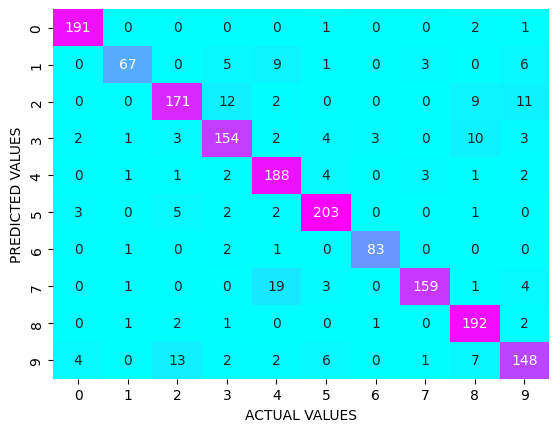

In [62]:
cm = confusion_matrix([int(x) for x in y_test], Y_pred)
sns.heatmap(cm, annot=True, cmap="cool", fmt='g', cbar=False)
plt.xlabel("ACTUAL VALUES")
plt.ylabel("PREDICTED VALUES")
plt.show()

### Finally, Audio Class Prediction Using the Trained CNN Model

We first preprocess the new audio data and then predict the class.


In [63]:
Audio('/content/car-horn-155026.mp3')

In [64]:
# Call the features_extractor function with the audio file
filename = "/content/car-horn-155026.mp3"
features = features_extractor(filename)

# Print the extracted features
if features is not None:
    print("Extracted Features (MFCCs):", features)

features = features.reshape(1,-1)

features.shape

print(features)

Extracted Features (MFCCs): [[-6.2547614e+02 -6.2474689e+02 -5.7181793e+02 ... -6.2042999e+02
  -6.2142572e+02 -6.2380511e+02]
 [ 0.0000000e+00  1.0298638e+00  5.0741859e+01 ...  7.1294765e+00
   5.7244487e+00  2.3627081e+00]
 [ 0.0000000e+00  1.0253193e+00  1.2110718e+01 ...  7.1089325e+00
   5.7133150e+00  2.3612895e+00]
 ...
 [ 0.0000000e+00 -1.7615482e-01 -1.8502612e+00 ...  2.0516660e+00
   2.5055790e+00  1.7850111e+00]
 [ 0.0000000e+00 -2.0475778e-01 -1.4866629e+00 ...  1.9176452e+00
   2.3935552e+00  1.7570953e+00]
 [ 0.0000000e+00 -2.3127323e-01  1.8721762e+00 ...  1.7881153e+00
   2.2826271e+00  1.7288139e+00]]
[[-625.47614   -624.7469    -571.81793   ...    1.7881153    2.282627
     1.7288139]]


In [65]:
# Flatten features from shape (1, 104720) to (104720,)
audio_signal = features.flatten()
sample_rate = 16000  # Resample audio if needed

# Compute a Mel spectrogram
spectrogram = librosa.feature.melspectrogram(y=audio_signal, sr=sample_rate, n_mels=40, fmax=8000)

# Convert to decibel (dB) scale for better feature representation
spectrogram = librosa.power_to_db(spectrogram, ref=np.max)

# Pad the spectrogram to match target shape
target_shape = (40, 173)
padded_spectrogram = np.pad(spectrogram, ((0, max(0, target_shape[0] - spectrogram.shape[0])),
                                          (0, max(0, target_shape[1] - spectrogram.shape[1]))),
                            mode='constant')

# Reshape to match model's expected input shape
padded_spectrogram = padded_spectrogram.reshape(1, 40, 173, 1)

# Use padded_spectrogram for model prediction
result_array = cnn_model.predict(padded_spectrogram)

print("Predicted results:", result_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predicted results: [[6.2189489e-09 9.9936241e-01 2.7797201e-10 6.1646686e-04 2.4231331e-06
  1.8205145e-06 7.7614750e-06 6.4900537e-06 2.6509836e-06 8.1965079e-10]]


In [66]:
print(labelencoder.classes_)

['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']


In [67]:
result_classes = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark',
                  'drilling', 'engine_idling', 'gun_shot', 'jackhammer',
                  'siren', 'street_music']


result = np.argmax(result_array[0])
print(result_classes[result])

car_horn


### Steps for Prediction:

1. **Feature Extraction**:
   - The `features_extractor` function extracts features from the audio file.
   - The extracted features are reshaped to a single-dimensional array with `reshape(1, -1)`.

2. **Mel Spectrogram Conversion**:
   - The flattened audio signal from `features.flatten()` is converted to a Mel spectrogram using `librosa.feature.melspectrogram`.
   - The Mel spectrogram is then converted to decibel (dB) scale using `librosa.power_to_db`, which can enhance the model’s learning process.

3. **Reshaping for Model Input**:
   - The Mel spectrogram is reshaped using `np.expand_dims` to match the model’s expected input shape of `(1, 40, 173, 1)`.

4. **Prediction and Result Extraction**:
   - The reshaped spectrogram is fed into the CNN model to obtain `result_array`.
   - `np.argmax(result_array[0])` identifies the highest probability index from the model output.
   - Using `result_classes`, this index is mapped to the corresponding class label, which is then printed.

> **Note**: The features extracted by the features_extractor function should align with the input format expected by the CNN model. If the model was trained using MFCC or similar processed features, this process should work correctly.

### Save the Model

In [68]:
# Save the model to an HDF5 file
cnn_model.save("cnn_model.keras")
print("Model saved as cnn_model.keras")

Model saved as cnn_model.keras


In [69]:
from tensorflow.keras.models import load_model

# Load the saved model
cnn_model = load_model("cnn_model.keras")
print("Model loaded successfully!")

Model loaded successfully!


# Training and Evaluating a ANN Model

In [70]:
# We will convert extracted_features to Pandas dataframe
extracted_features_df = pd.DataFrame(extracted_features,columns=['feature','class'])

# Target length for padding or trimming
target_length = 173

# Initialize lists to store features and labels with consistent length
features = []
labels = []

for i, row in extracted_features_df.iterrows():
    f = row['feature']
    if isinstance(f, np.ndarray) and f.shape[0] == 40:
        # Pad or trim each feature to the target length
        padded_feature = np.pad(f, ((0, 0), (0, max(0, target_length - f.shape[1]))), mode='constant')[:, :target_length]
        features.append(padded_feature)
        labels.append(row['class'])

# Convert to numpy arrays
X = np.array(features)
y = np.array(labels)

# Ensure X and y have the same length
print("Length of X:", len(X))
print("Length of y:", len(y))

Length of X: 8732
Length of y: 8732


In [71]:
labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [72]:
# Flatten input data to 2D for ANN
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)

In [73]:
# Define the model
ann_model = Sequential()

# Input layer and new 1024-unit hidden layer
ann_model.add(Dense(1024, activation="relu", input_shape=(X_train.shape[1],), kernel_regularizer=l2(0.001)))
ann_model.add(BatchNormalization())
ann_model.add(Dropout(0.4))

# 2nd hidden layer
ann_model.add(Dense(512, activation="relu", kernel_regularizer=l2(0.002)))
ann_model.add(BatchNormalization())
ann_model.add(Dropout(0.4))

# 3rd hidden layer
ann_model.add(Dense(256, activation="relu", kernel_regularizer=l2(0.001)))
ann_model.add(BatchNormalization())

# 4th hidden layer
ann_model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001)))
ann_model.add(BatchNormalization())

# 5th hidden layer
ann_model.add(Dense(64, activation="relu", kernel_regularizer=l2(0.001)))
ann_model.add(BatchNormalization())

# 6th hidden layer
ann_model.add(Dense(32, activation="relu", kernel_regularizer=l2(0.001)))
ann_model.add(BatchNormalization())

# Output layer
ann_model.add(Dense(10, activation="softmax"))

# Compile the model
optimizer = Adam(learning_rate=0.0005)
ann_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

# Display model summary
ann_model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 1024)                │       7,087,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 10)                  │             330 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,794,858 (29.74 MB)

 Trainable params: 7,790,826 (29.72 MB)

 Non-trainable params: 4,032 (15.75 KB)

In [74]:
# Define EarlyStopping and ReduceLROnPlateau callbacks
callbacks = [
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)
]

# Train the model
history = ann_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=callbacks
)

Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - accuracy: 0.3022 - loss: 5.7720 - val_accuracy: 0.5152 - val_loss: 4.7600 - learning_rate: 5.0000e-04
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - accuracy: 0.5192 - loss: 4.6613 - val_accuracy: 0.6199 - val_loss: 4.0490 - learning_rate: 5.0000e-04
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 136ms/step - accuracy: 0.5971 - loss: 4.0395 - val_accuracy: 0.6050 - val_loss: 3.6773 - learning_rate: 5.0000e-04
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - accuracy: 0.6135 - loss: 3.6164 - val_accuracy: 0.6520 - val_loss: 3.3002 - learning_rate: 5.0000e-04
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - accuracy: 0.6520 - loss: 3.2432 - val_accuracy: 0.6577 - val_loss: 3.0846 - learning_rate: 5.0000e-04
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - accuracy: 0.6815 - loss: 2.9504 - val_accuracy: 0.7006 - val_loss: 2.7786 - learning_rate: 5.0000e-04
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━

In [75]:
validation_test_set_accuracy = ann_model.evaluate(X_test,y_test,verbose=0)
print(validation_test_set_accuracy[1])

0.8952490091323853


## ANN Model Performance Evaluation



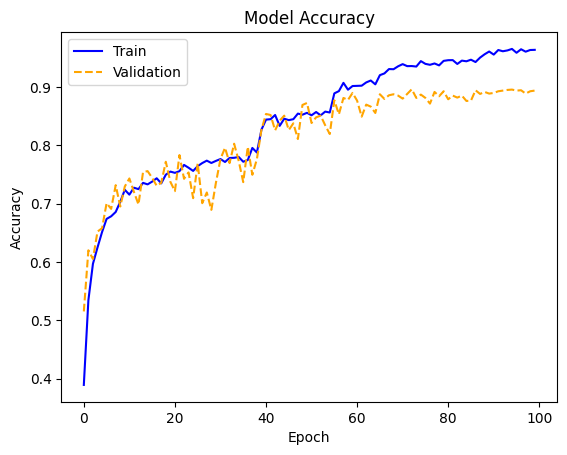

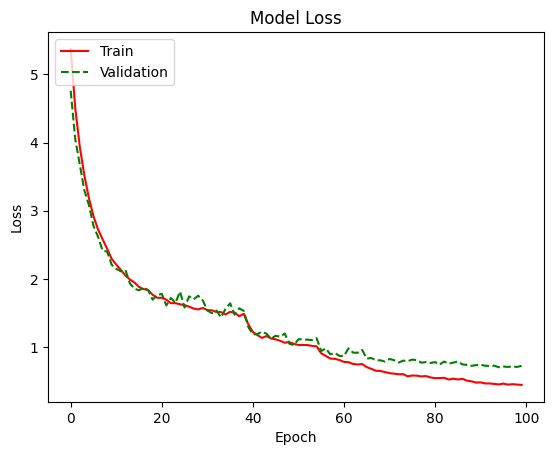

In [76]:
# Plotting the accuracy
plt.plot(history.history['accuracy'], color='blue', linestyle='-', label='Train')
plt.plot(history.history['val_accuracy'], color='orange', linestyle='--', label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

# Plotting the loss
plt.plot(history.history['loss'], color='red', linestyle='-', label='Train')
plt.plot(history.history['val_loss'], color='green', linestyle='--', label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

In [77]:
# Predicting on the test set
Y_pred = ann_model.predict(X_test)
Y_pred_classes = [np.argmax(i) for i in Y_pred]
y_test_classes = [np.argmax(i) for i in y_test]

# Classification report
print(classification_report(y_test_classes, Y_pred_classes))

55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
              precision    recall  f1-score   support

           0       0.90      0.99      0.94       195
           1       0.91      0.90      0.91        91
           2       0.84      0.77      0.80       205
           3       0.85      0.85      0.85       182
           4       0.89      0.93      0.91       202
           5       0.95      0.97      0.96       216
           6       0.98      0.93      0.95        87
           7       0.94      0.94      0.94       187
           8       0.96      0.95      0.96       199
           9       0.77      0.74      0.75       183

    accuracy                           0.90      1747
   macro avg       0.90      0.90      0.90      1747
weighted avg       0.89      0.90      0.89      1747



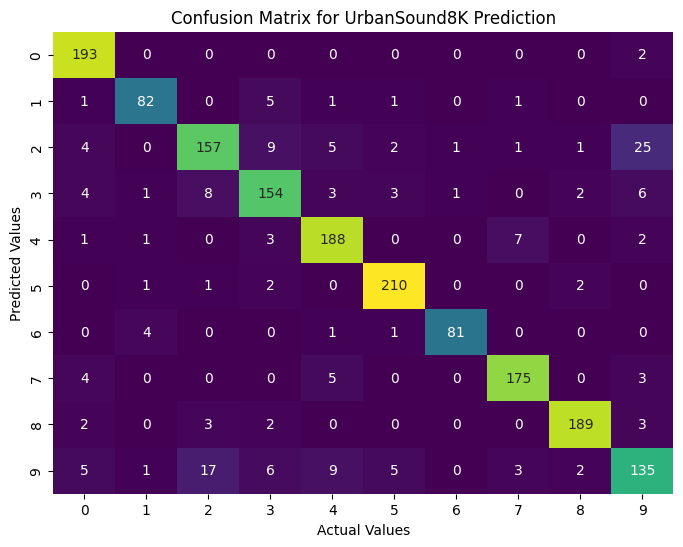

Test Accuracy: 0.8952490091323853


In [78]:
# Confusion matrix
plt.figure(figsize=(8, 6))
plt.title("Confusion Matrix for UrbanSound8K Prediction")
cm = confusion_matrix(y_test_classes, Y_pred_classes)

sns.heatmap(cm, annot=True, cmap="viridis", fmt='g', cbar=False)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()

# Evaluate test accuracy
test_accuracy = ann_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy[1]}")

### Finally, Audio Class Prediction Using the Trained ANN Model



In [87]:
Audio('/content/dog-234817.mp3')

In [88]:
# Function to preprocess the audio file and extract features
def preprocess_audio(file_path):
    # Load the audio file
    signal, sr = librosa.load(file_path, sr=None)

    # Extract features (e.g., Mel spectrogram)
    mel = librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=128)

    # Convert to log scale (dB)
    mel_db = librosa.power_to_db(mel, ref=np.max)

    # Flatten the Mel spectrogram to fit the input shape of the ANN
    mel_db_flattened = mel_db.flatten()  # Shape will be (n_mels * frames,)
    return mel_db_flattened

In [89]:
# Call the preprocess_audio function with the audio file
filename = "/content/dog-234817.mp3"
features = preprocess_audio(filename)

# Print the extracted features
if features is not None:
    print("Extracted Features (Mel Spectrogram):", features)
    print("Features shape:", features.shape)  # Check the shape of features

Extracted Features (Mel Spectrogram): [-80.       -80.       -57.941345 ... -80.       -80.       -80.      ]
Features shape: (24064,)


In [90]:
expected_input_shape = 6920

if features.shape[0] < expected_input_shape:
    # Pad with zeros to reach the required shape
    features = np.pad(features, (0, expected_input_shape - features.shape[0]), 'constant')
else:
    # Trim if necessary
    features = features[:expected_input_shape]

# Reshape to (1, 6920)
features = features.reshape(1, -1)

In [91]:
# Predict using the ANN model
result_array = ann_model.predict(features)

result_classes = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark',
                  'drilling', 'engine_idling', 'gun_shot', 'jackhammer',
                  'siren', 'street_music']

# Get the predicted class
result = np.argmax(result_array[0])
print("Predicted class:", result_classes[result])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Predicted class: dog_bark


In [92]:
# Save the model in the native Keras format
ann_model.save('ann_model.keras')


In [93]:
# Save in `.keras` format
ann_model.save("ann_model.keras")

# Or save in `.h5` format
ann_model.save("ann_model.h5")

# FINAL THOUGHTS

Working with sound data for prediction was both challenging and rewarding. Using CNN and ANN models, I achieved 90% accuracy with each, which was very satisfying. Along the way, I explored libraries like librosa and resampy, and experimented with various feature extraction techniques. This project introduced me to a different kind of data analysis, where sound waves and frequency patterns became the foundation for insights.

I documented each step carefully in the notebook, hoping it serves as a useful and enjoyable resource for others. Sound data can open new dimensions in data science, and I highly recommend giving it a try. It not only enhanced my technical skills but also broadened my understanding of signal processing and machine learning.

Thank you for taking the time to go through this notebook—hope it inspires new ideas and insights for your own projects!

In [94]:
# THANK YOUUU